# importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import lime
import lime.lime_tabular


# Reading the dataset

In [2]:

df = pd.read_csv('PROCESSED.csv')

# Display the first few rows of the dataset
df.head()


,Make,Vehicle_Class,Engine_Size,Cylinders,Transmission,Fuel_Type,Fuel_Consumption_City,Fuel_Consumption_Hwy,Fuel_Consumption_Comb,Fuel_Consumption_Comb.1,CO2_Emissions
0,0,0,2.0,4,14,4,9.9,6.7,8.5,33,196
1,0,0,2.4,4,25,4,11.2,7.7,9.6,29,221
2,0,0,1.5,4,22,4,6.0,5.8,5.9,48,136
3,0,11,3.5,6,15,4,12.7,9.1,11.1,25,255
4,0,11,3.5,6,15,4,12.1,8.7,10.6,27,244


In [3]:
df.shape

(7385, 11)

In [4]:
df.columns

Index(['Make', 'Vehicle_Class', 'Engine_Size', 'Cylinders', 'Transmission',
       'Fuel_Type', 'Fuel_Consumption_City', 'Fuel_Consumption_Hwy',
       'Fuel_Consumption_Comb', 'Fuel_Consumption_Comb.1', 'CO2_Emissions'],
      dtype='object')

(array([ 481.,  791.,  995., 1195.,  729.,  535.,  756.,  934.,  176.,
         793.]),
 array([ 0. ,  4.1,  8.2, 12.3, 16.4, 20.5, 24.6, 28.7, 32.8, 36.9, 41. ]),
 <BarContainer object of 10 artists>)

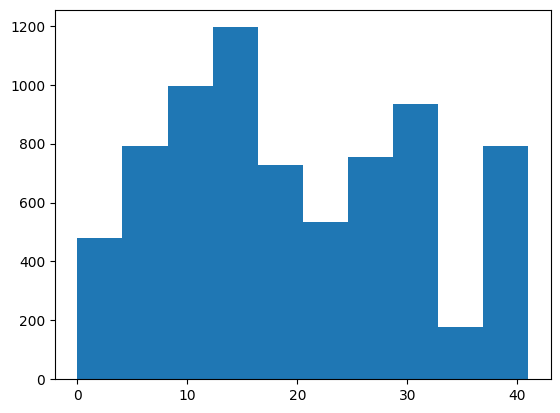

In [5]:
plt.hist(df['Make'], bins=None, range=None, density=False)

(array([1661., 1133.,  406.,  159.,  615.,   53.,  858., 1217., 1195.,
          88.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ]),
 <BarContainer object of 10 artists>)

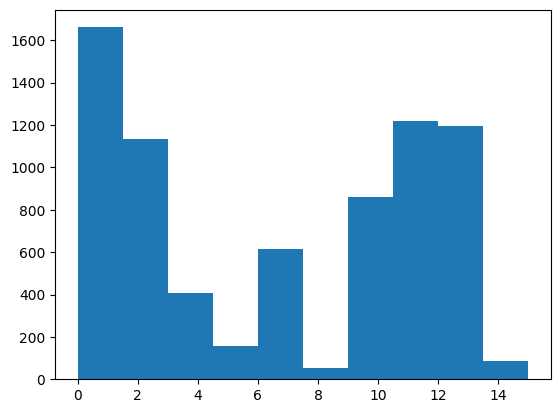

In [6]:
plt.hist(df['Vehicle_Class'], bins=None, range=None, density=False)

(array([ 777., 1733., 1719., 1463.,  427.,  655.,  312.,  291.,    0.,
           8.]),
 array([0.9 , 1.65, 2.4 , 3.15, 3.9 , 4.65, 5.4 , 6.15, 6.9 , 7.65, 8.4 ]),
 <BarContainer object of 10 artists>)

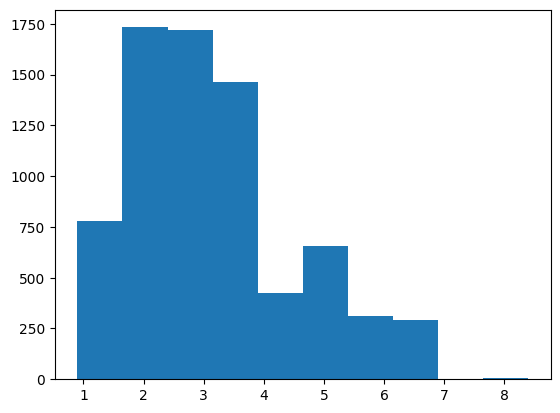

In [7]:
plt.hist(df['Engine_Size'], bins=None, range=None, density=False)

(array([3.315e+03, 2.600e+01, 2.446e+03, 1.402e+03, 0.000e+00, 4.200e+01,
        1.510e+02, 0.000e+00, 0.000e+00, 3.000e+00]),
 array([ 3. ,  4.3,  5.6,  6.9,  8.2,  9.5, 10.8, 12.1, 13.4, 14.7, 16. ]),
 <BarContainer object of 10 artists>)

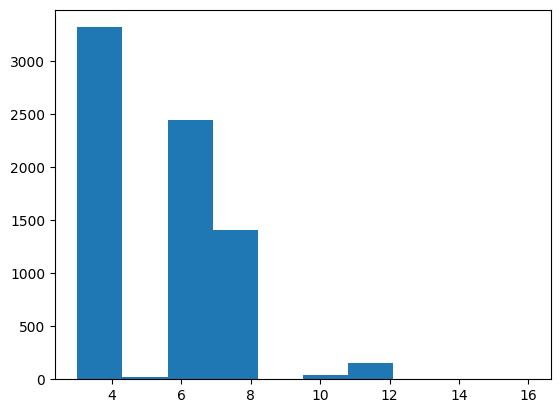

In [8]:
plt.hist(df['Cylinders'], bins=None, range=None, density=False)

(array([ 180., 1332.,  343.,  639.,  171., 1352., 1607.,  306.,  270.,
        1185.]),
 array([ 0. ,  2.6,  5.2,  7.8, 10.4, 13. , 15.6, 18.2, 20.8, 23.4, 26. ]),
 <BarContainer object of 10 artists>)

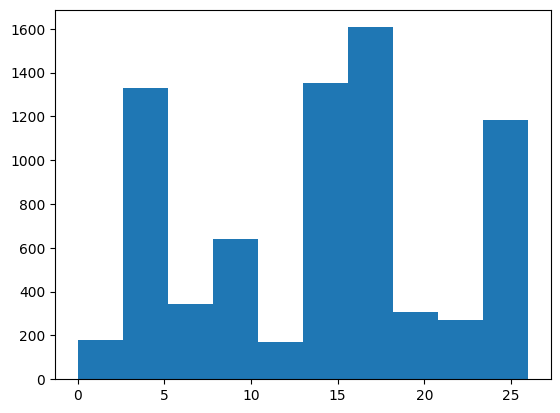

In [9]:
plt.hist(df['Transmission'], bins=None, range=None, density=False)

(array([1.750e+02, 0.000e+00, 3.690e+02, 0.000e+00, 0.000e+00, 2.000e+00,
        0.000e+00, 3.637e+03, 0.000e+00, 3.202e+03]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <BarContainer object of 10 artists>)

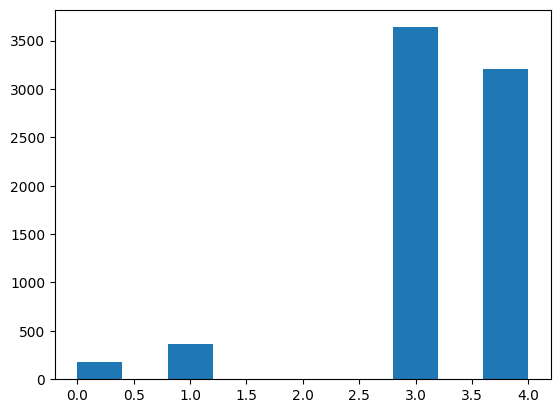

In [10]:
plt.hist(df['Fuel_Type'], bins=None, range=None, density=False)

(array([ 150., 1187., 2432., 1881., 1058.,  416.,  200.,   42.,   11.,
           8.]),
 array([ 4.2 ,  6.84,  9.48, 12.12, 14.76, 17.4 , 20.04, 22.68, 25.32,
        27.96, 30.6 ]),
 <BarContainer object of 10 artists>)

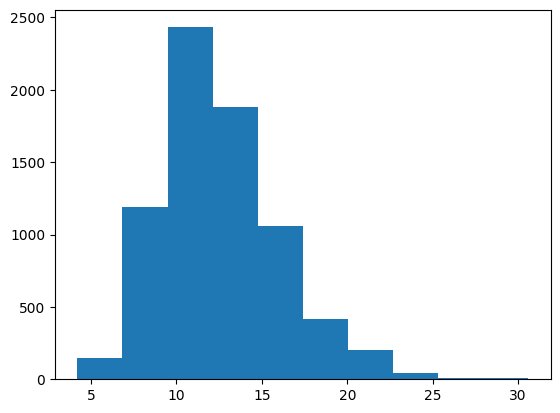

In [11]:
plt.hist(df['Fuel_Consumption_City'], bins=None, range=None, density=False)

(array([ 121., 1556., 2358., 1877.,  836.,  378.,  182.,   42.,   19.,
          16.]),
 array([ 4.  ,  5.66,  7.32,  8.98, 10.64, 12.3 , 13.96, 15.62, 17.28,
        18.94, 20.6 ]),
 <BarContainer object of 10 artists>)

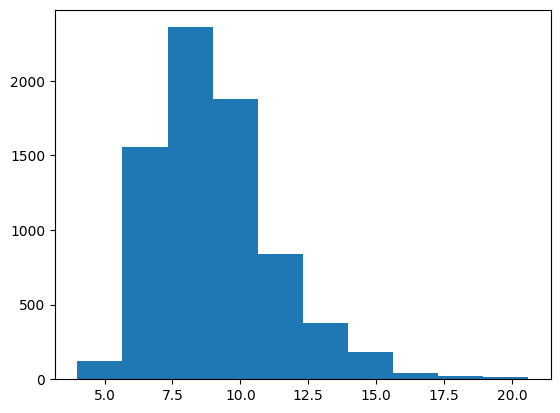

In [12]:
plt.hist(df['Fuel_Consumption_Hwy'], bins=None, range=None, density=False)

(array([ 134., 1270., 2390., 1939.,  996.,  410.,  176.,   49.,   12.,
           9.]),
 array([ 4.1,  6.3,  8.5, 10.7, 12.9, 15.1, 17.3, 19.5, 21.7, 23.9, 26.1]),
 <BarContainer object of 10 artists>)

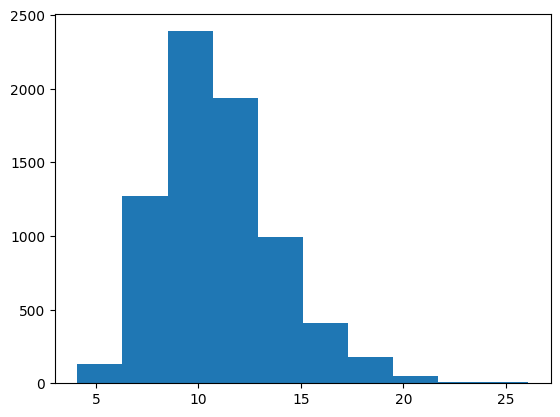

In [13]:
plt.hist(df['Fuel_Consumption_Comb'], bins=None, range=None, density=False)

(array([ 134., 1270., 2390., 1939.,  996.,  410.,  176.,   49.,   12.,
           9.]),
 array([ 4.1,  6.3,  8.5, 10.7, 12.9, 15.1, 17.3, 19.5, 21.7, 23.9, 26.1]),
 <BarContainer object of 10 artists>)

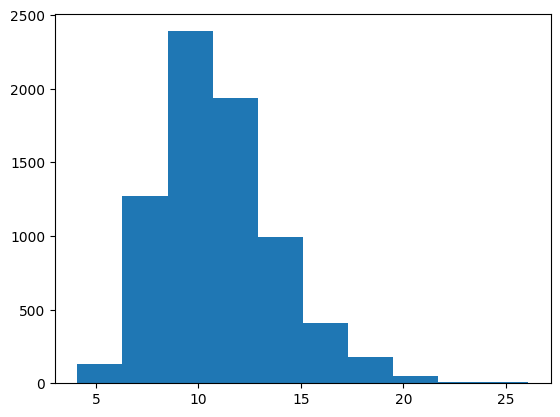

In [14]:
plt.hist(df['Fuel_Consumption_Comb'], bins=None, range=None, density=False)

(array([ 112.,  630., 1875., 2083., 1541.,  747.,  276.,   86.,   27.,
           8.]),
 array([ 96. , 138.6, 181.2, 223.8, 266.4, 309. , 351.6, 394.2, 436.8,
        479.4, 522. ]),
 <BarContainer object of 10 artists>)

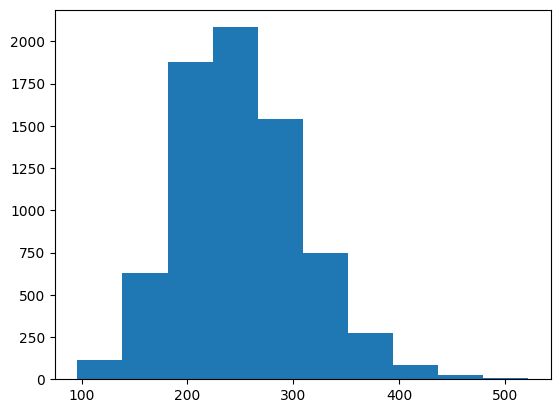

In [15]:
plt.hist(df['CO2_Emissions'], bins=None, range=None, density=False)

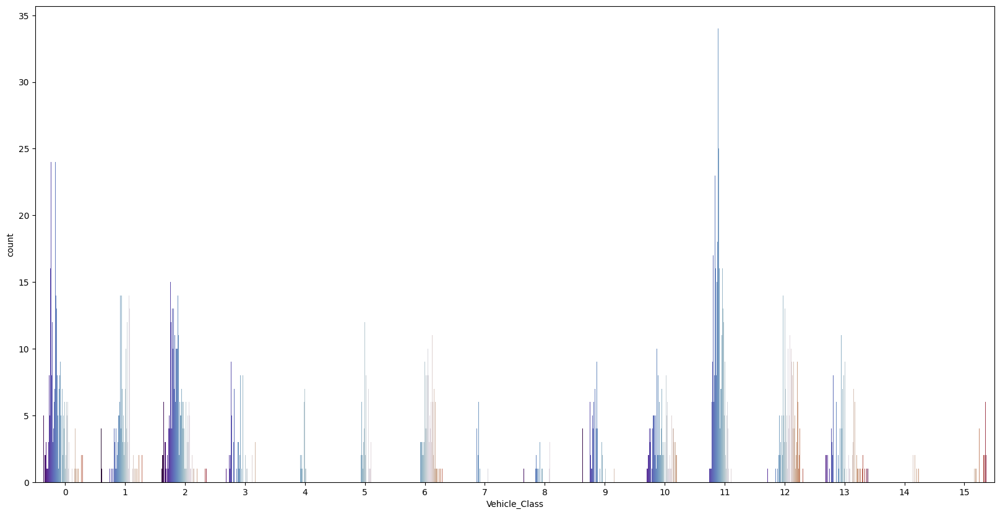

In [16]:
plt.figure(figsize=(20,10))
sns.countplot(x=df['Vehicle_Class'],data=df,hue='CO2_Emissions',palette="twilight_shifted",saturation=2,dodge=True,)
plt.legend([],[], frameon=False) 
plt.savefig("Vehicle_Class&CO2_Emissions.png")

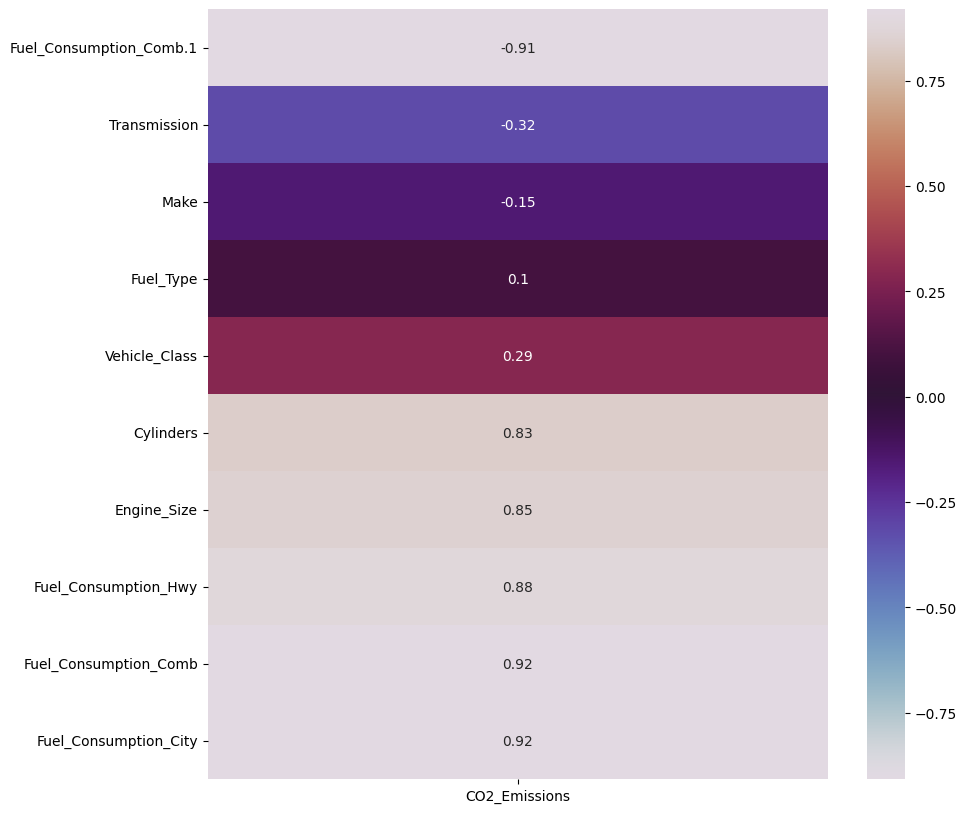

In [17]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.DataFrame(df.corr()['CO2_Emissions']).sort_values(by='CO2_Emissions').transpose().drop('CO2_Emissions',axis=1).transpose(),annot=True,cmap='twilight')
plt.savefig("TargetCorrelations.png")

/var/folders/g9/30rmm0n512d1d4vd5q_fyfch0000gn/T/ipykernel_52625/1136319164.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot( x='Importance (%)',y='Feature',orient='h',data=features_data,palette='twilight_shifted_r')


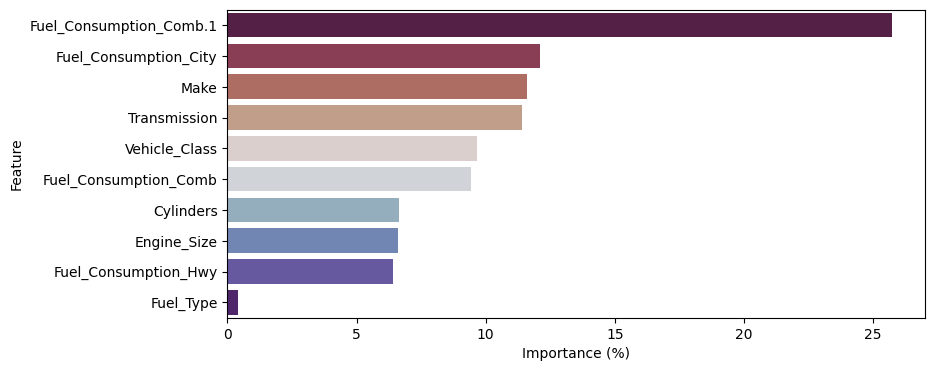

In [18]:
X = df.drop('CO2_Emissions',axis=1)
Y = df['CO2_Emissions']
from sklearn.feature_selection import SelectKBest, chi2
fs = SelectKBest(score_func=chi2, k='all')
fs.fit(X, Y)
per = []
for i in fs.scores_:
    per.append(round(((i/sum(fs.scores_))*100),3))

features_data = pd.DataFrame({'Feature':X.columns,'Scores':fs.scores_,'Importance (%)':per}).sort_values(by=['Scores'],ascending=False)

plt.figure(figsize=(9,4))
sns.barplot( x='Importance (%)',y='Feature',orient='h',data=features_data,palette='twilight_shifted_r')
insignificant = features_data.loc[features_data['Importance (%)']<0.005]['Feature'].unique()
features_data = features_data.set_index('Feature')
features_data
plt.savefig("FeatureImportance.png")

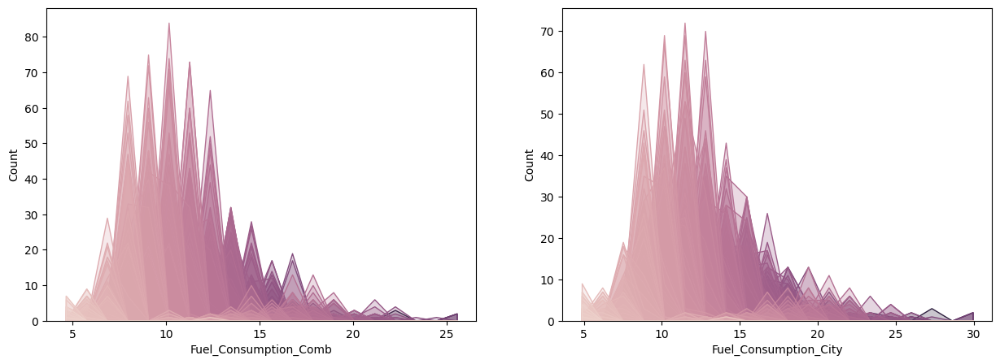

In [19]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.histplot(data=df,hue='CO2_Emissions',x='Fuel_Consumption_Comb',bins=20,element='poly')
plt.legend([],[], frameon=False) 
plt.subplot(1,2,2)
sns.histplot(data=df,hue='CO2_Emissions',x='Fuel_Consumption_City',bins=20,element='poly')
plt.legend([],[], frameon=False) 
plt.savefig("Fuel_Consumption_Comb&Fuel_Consumption_City.png")

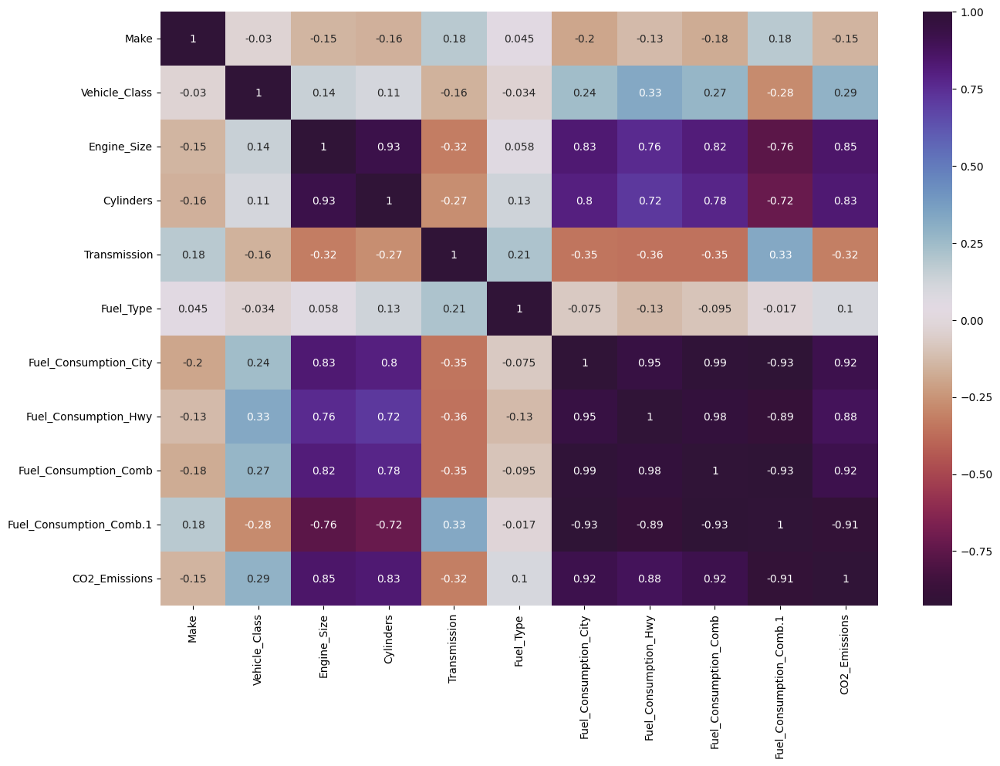

In [20]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),cbar = True, annot =True,cmap='twilight_shifted_r');
plt.savefig("heatmap.png")

In [44]:
# Check for missing values
print(df.isnull().sum())


# Encode categorical variables
# df = pd.get_dummies(df, columns=['Make', 'Vehicle_Class', 'Transmission', 'Fuel_Type'], drop_first=True)

# Split the data into features and target variable
X = df.drop(columns=['CO2_Emissions'])
y = df['CO2_Emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


Make                       0
Vehicle_Class              0
Engine_Size                0
Cylinders                  0
Transmission               0
Fuel_Type                  0
Fuel_Consumption_City      0
Fuel_Consumption_Hwy       0
Fuel_Consumption_Comb      0
Fuel_Consumption_Comb.1    0
CO2_Emissions              0
dtype: int64


In [46]:
# Initialize the model
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')


Mean Squared Error: 10.640990936610686
R^2 Score: 0.9969063536092169


In [47]:
# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['CO2_Emissions'], verbose=True, mode='regression')


i = 0 # index of the instance to explain
exp = explainer.explain_instance(X_test[i], model.predict, num_features=10)

# Show the explanation
exp.show_in_notebook(show_table=True)


Intercept 237.26146128920325
Prediction_local [267.59613785]
Right: 253.04


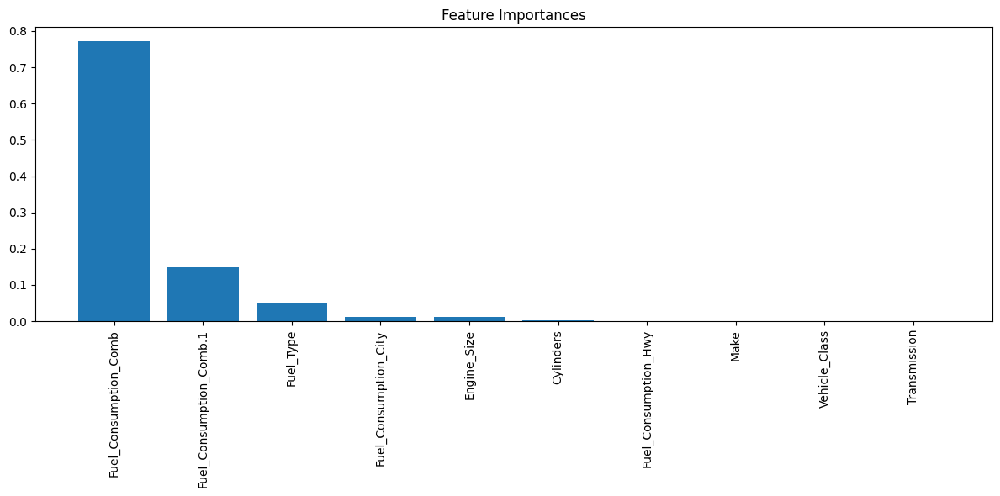

In [48]:
# Get feature importances from the model
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot the feature importances
plt.figure(figsize=(12, 6))
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.tight_layout()
plt.show()


# MODEL 1

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error

# Initialize the model
model_lr = LinearRegression()

# Train the model
model_lr.fit(X_train, y_train)

# Predict on the test set
y_pred_lr = model_lr.predict(X_test)

# Evaluate the model
mape_lr = mean_absolute_percentage_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

print(f'Linear Regression - MAPE: {mape_lr}')
print(f'Linear Regression - R² Score: {r2_lr}')

# LIME analysis
explainer_lr = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['CO2_Emissions'], verbose=True, mode='regression')
exp_lr = explainer_lr.explain_instance(X_test[0], model_lr.predict, num_features=10)
exp_lr.show_in_notebook(show_table=True)


Linear Regression - MAPE: 0.043703205571465766
Linear Regression - R² Score: 0.9142569571049316
Intercept 239.63884566340116
Prediction_local [265.56520691]
Right: 258.19575828014416


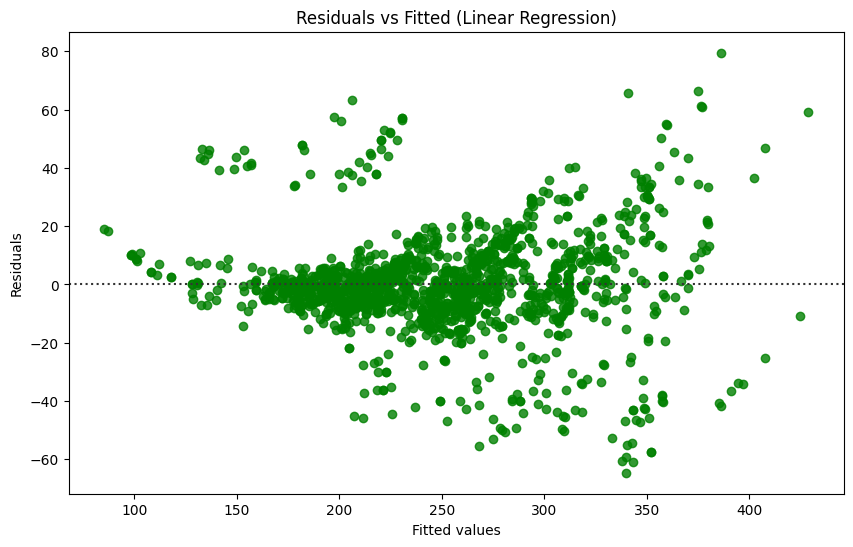

In [57]:
import seaborn as sns
# Residual plot for Linear Regression
plt.figure(figsize=(10, 6))
sns.residplot(x=y_pred_lr, y=y_test, color="g")
plt.title('Residuals vs Fitted (Linear Regression)')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()


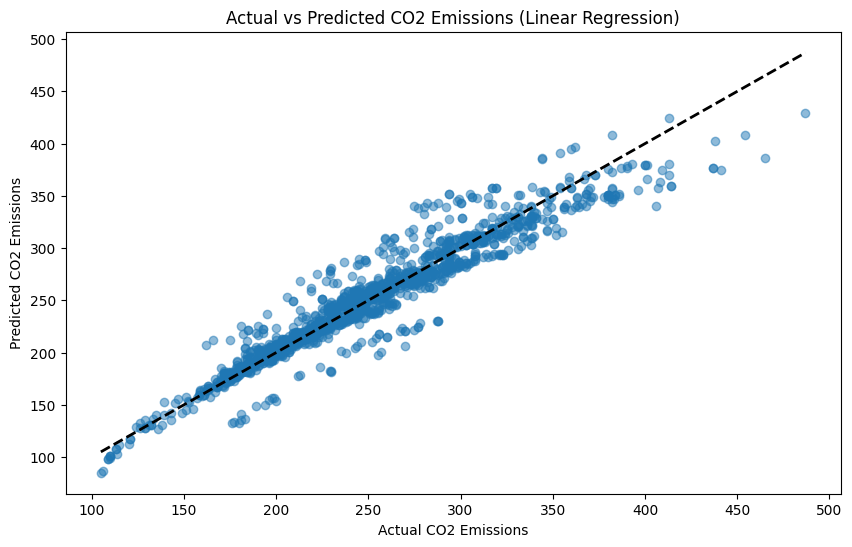

In [52]:
# Plot Actual vs Predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_lr, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Diagonal line
plt.title('Actual vs Predicted CO2 Emissions (Linear Regression)')
plt.xlabel('Actual CO2 Emissions')
plt.ylabel('Predicted CO2 Emissions')
plt.show()


# MODEL 2

In [53]:
from sklearn.tree import DecisionTreeRegressor
import joblib
# Initialize the model
model_dt = DecisionTreeRegressor(random_state=42)

# Train the model
model_dt.fit(X_train, y_train)

# Predict on the test set
y_pred_dt = model_dt.predict(X_test)

# Evaluate the model
mape_dt = mean_absolute_percentage_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print(f'Decision Tree - MAPE: {mape_dt}')
print(f'Decision Tree - R² Score: {r2_dt}')

# LIME analysis
explainer_dt = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['CO2_Emissions'], verbose=True, mode='regression')
exp_dt = explainer_dt.explain_instance(X_test[0], model_dt.predict, num_features=10)
exp_dt.show_in_notebook(show_table=True)

# Save the scaler
joblib.dump(scaler, 'scaler.pkl')
joblib.dump(model_dt, 'dtt.pkl')

Decision Tree - MAPE: 0.007222327958258283
Decision Tree - R² Score: 0.9958942198756517
Intercept 232.31492519474622
Prediction_local [274.53147182]
Right: 253.0


['dtt.pkl']

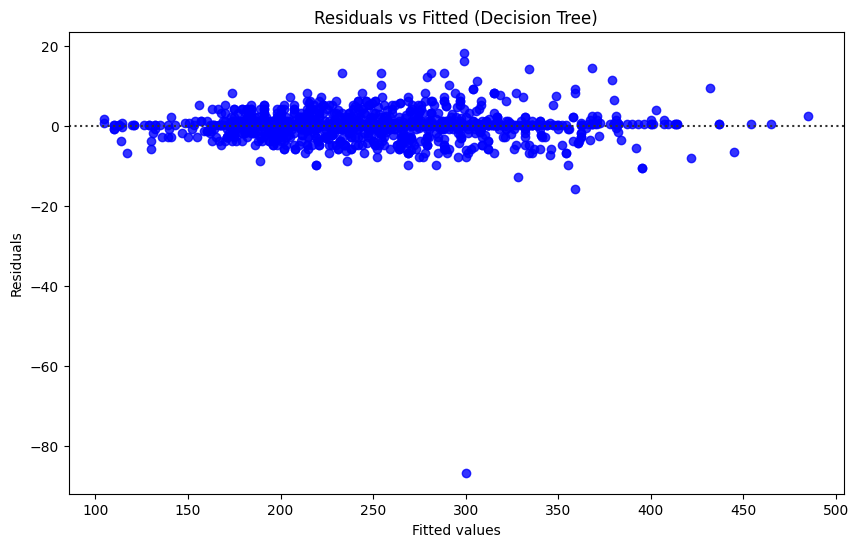

In [54]:
# Residual plot for Decision Tree
plt.figure(figsize=(10, 6))
sns.residplot(x=y_pred_dt, y=y_test, color="b")
plt.title('Residuals vs Fitted (Decision Tree)')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.show()

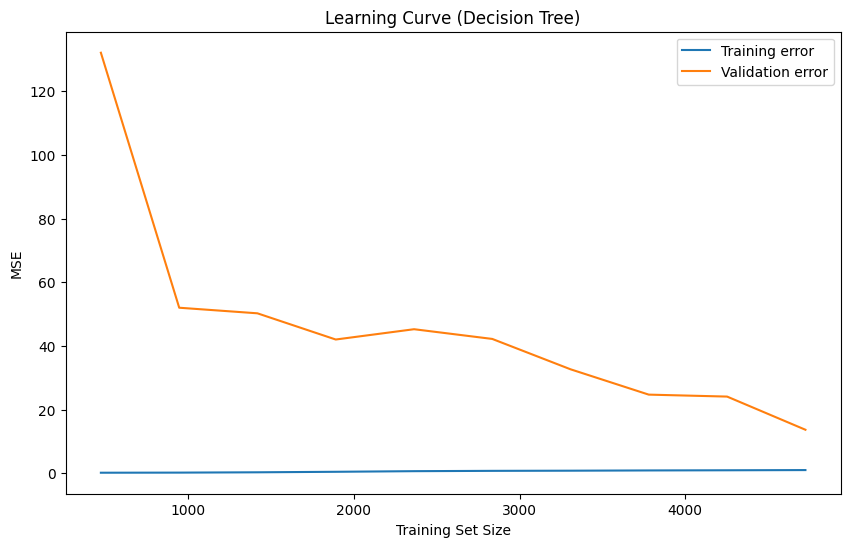

In [55]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(
    model_dt, X_train, y_train, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error'
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, -train_scores.mean(axis=1), label='Training error')
plt.plot(train_sizes, -test_scores.mean(axis=1), label='Validation error')
plt.title('Learning Curve (Decision Tree)')
plt.xlabel('Training Set Size')
plt.ylabel('MSE')
plt.legend()
plt.show()

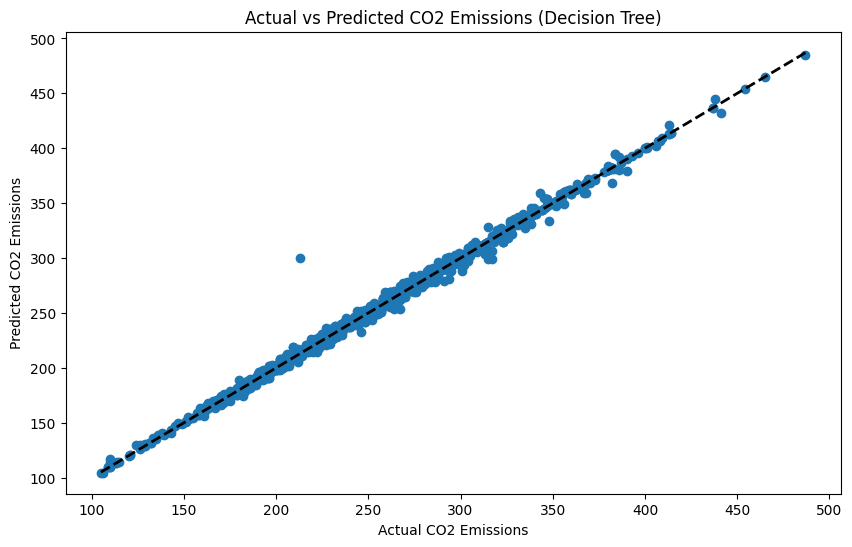

In [56]:
# Prediction Error Plot for Decision Tree
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_dt)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.title('Actual vs Predicted CO2 Emissions (Decision Tree)')
plt.xlabel('Actual CO2 Emissions')
plt.ylabel('Predicted CO2 Emissions')
plt.show()

# MODEL 3

In [31]:
from sklearn.svm import SVR

# Initialize the model
model_svr = SVR()

# Train the model
model_svr.fit(X_train, y_train)

# Predict on the test set
y_pred_svr = model_svr.predict(X_test)

# Evaluate the model
mape_svr = mean_absolute_percentage_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

print(f'Support Vector Regressor - MAPE: {mape_svr}')
print(f'Support Vector Regressor - R² Score: {r2_svr}')

# LIME analysis
explainer_svr = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['CO2_Emissions'], verbose=True, mode='regression')
exp_svr = explainer_svr.explain_instance(X_test[0], model_svr.predict, num_features=10)
exp_svr.show_in_notebook(show_table=True)


Support Vector Regressor - MAPE: 0.029815731273750996
Support Vector Regressor - R² Score: 0.9296839715105534
Intercept 249.05338949863344
Prediction_local [264.08647579]
Right: 253.34220900660657


# MODEL 4

In [32]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize the model
model_gb = GradientBoostingRegressor(random_state=42)

# Train the model
model_gb.fit(X_train, y_train)

# Predict on the test set
y_pred_gb = model_gb.predict(X_test)

# Evaluate the model
mape_gb = mean_absolute_percentage_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

print(f'Gradient Boosting Regressor - MAPE: {mape_gb}')
print(f'Gradient Boosting Regressor - R² Score: {r2_gb}')

# LIME analysis
explainer_gb = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['CO2_Emissions'], verbose=True, mode='regression')
exp_gb = explainer_gb.explain_instance(X_test[0], model_gb.predict, num_features=10)
exp_gb.show_in_notebook(show_table=True)


Gradient Boosting Regressor - MAPE: 0.010230953723663002
Gradient Boosting Regressor - R² Score: 0.9964091420868766
Intercept 225.4174867200669
Prediction_local [268.83367207]
Right: 252.90119437273987


# MODEL 5

In [33]:
from sklearn.neighbors import KNeighborsRegressor

# Initialize the model
model_knn = KNeighborsRegressor(n_neighbors=5)

# Train the model
model_knn.fit(X_train, y_train)

# Predict on the test set
y_pred_knn = model_knn.predict(X_test)

# Evaluate the model
mape_knn = mean_absolute_percentage_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f'K-Neighbors Regressor - MAPE: {mape_knn}')
print(f'K-Neighbors Regressor - R² Score: {r2_knn}')

# LIME analysis
explainer_knn = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['CO2_Emissions'], verbose=True, mode='regression')
exp_knn = explainer_knn.explain_instance(X_test[0], model_knn.predict, num_features=10)
exp_knn.show_in_notebook(show_table=True)


K-Neighbors Regressor - MAPE: 0.01639496397930132
K-Neighbors Regressor - R² Score: 0.9895191605199287
Intercept 247.1113182033111
Prediction_local [264.56631986]
Right: 251.8


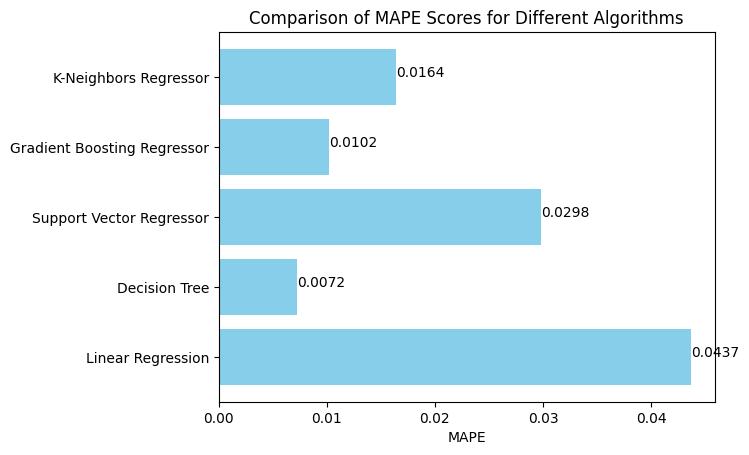

The best model is Decision Tree with a MAPE of 0.0072


['model.pkl']

In [34]:
import matplotlib.pyplot as plt
import joblib

# Dictionary to store the models and their corresponding MAPE scores
models = {
    "Linear Regression": model_lr,
    "Decision Tree": model_dt,
    "Support Vector Regressor": model_svr,
    "Gradient Boosting Regressor": model_gb,
    "K-Neighbors Regressor": model_knn
}

mape_scores = {
    "Linear Regression": mape_lr,
    "Decision Tree": mape_dt,
    "Support Vector Regressor": mape_svr,
    "Gradient Boosting Regressor": mape_gb,
    "K-Neighbors Regressor": mape_knn
}

# Plotting the MAPE scores
fig, ax = plt.subplots()
algorithms = list(mape_scores.keys())
scores = list(mape_scores.values())

ax.barh(algorithms, scores, color='skyblue')
ax.set_xlabel('MAPE')
ax.set_title('Comparison of MAPE Scores for Different Algorithms')

for index, value in enumerate(scores):
    ax.text(value, index, f'{value:.4f}')

plt.show()

# Determine the best model
best_model_name = min(mape_scores, key=mape_scores.get)
best_model = models[best_model_name]
print(f'The best model is {best_model_name} with a MAPE of {mape_scores[best_model_name]:.4f}')

# Save the best model
joblib.dump(model_lr, 'model.pkl')


In [35]:
# Save X_train
joblib.dump(X_train, 'X_train_scaled.pkl')

['X_train_scaled.pkl']

In [36]:
import joblib

# Assuming you have a DataFrame `df` and the target variable is `CO2_Emissions`
feature_names = df.drop(columns=['CO2_Emissions']).columns.tolist()

# Save the feature names
joblib.dump(feature_names, 'feature_names.pkl')

['feature_names.pkl']

In [37]:
import joblib
import numpy as np

# Load the model
loaded_model = joblib.load('model.pkl')

# Sample data (replace with your actual sample data)
sample_data = np.array([[3,11,2,4,17,4,9.9,8.3,9.2,31]])

# Predict using the loaded model
predicted_emissions = loaded_model.predict(sample_data)

# Display the output
print(f'Predicted CO2 Emissions: {abs(predicted_emissions[0]):.3f}')


Predicted CO2 Emissions: 34.023


In [38]:
import joblib
import numpy as np

# Load the model
loaded_model = joblib.load('model.pkl')

# Function to generate random data points
def generate_random_data(num_samples):
    np.random.seed(42) 
    
    makes = np.random.randint(0, 10, num_samples)  # Random numbers for 'Make'
    vehicle_classes = np.random.randint(0, 5, num_samples)  # Random numbers for 'Vehicle Class'
    engine_sizes = np.round(np.random.uniform(1.0, 4.0, num_samples), 1)
    cylinders = np.random.choice([4, 6, 8], num_samples)
    transmissions = np.random.randint(0, 5, num_samples)  # Random numbers for 'Transmission'
    fuel_types = np.random.randint(0, 3, num_samples)  # Random numbers for 'Fuel Type'
    fuel_consumption_city = np.round(np.random.uniform(5.0, 15.0, num_samples), 1)
    fuel_consumption_hwy = np.round(np.random.uniform(3.0, 10.0, num_samples), 1)
    fuel_consumption_comb = np.round((fuel_consumption_city + fuel_consumption_hwy) / 2, 1)
    fuel_consumption_mpg = np.round(235.2 / fuel_consumption_comb, 1)
    co2_emissions = np.round(np.random.uniform(100, 300, num_samples), 1)
    
    data = np.column_stack((makes, vehicle_classes, engine_sizes, cylinders, transmissions,
                            fuel_types, fuel_consumption_city, fuel_consumption_hwy,
                            fuel_consumption_comb, fuel_consumption_mpg, co2_emissions))
    
    return data

# Generate random data for 10 cars
num_samples = 10
data = generate_random_data(num_samples)

# Predict CO2 emissions using the loaded model
co2_predictions = loaded_model.predict(data[:, :-1])

# Generate random acceleration and deceleration values for each vehicle
acceleration = np.random.uniform(0, 10, num_samples)  # random acceleration data
deceleration = np.random.uniform(-10, 0, num_samples)  # random deceleration data

# Print vehicle type, emission, acceleration, and deceleration
print("Vehicle Type, CO2 Emission, Acceleration, Deceleration")
for i in range(num_samples):
    vehicle_type = data[i, 1]  # Vehicle Class
    emission = co2_predictions[i]  # CO2 Emission
    acc = acceleration[i]
    dec = deceleration[i]
    
    # Send alert if acceleration > threshold or deceleration < threshold
    acc_threshold = 7.5
    dec_threshold = -7.5
    
    if acc > acc_threshold:
        print(f"Alert: Acceleration above threshold for vehicle {i + 1}!")
    if dec < dec_threshold:
        print(f"Alert: Deceleration below threshold for vehicle {i + 1}!")
    
    print(f"{vehicle_type}, {emission:.2f}, {acc:.2f}, {dec:.2f}")


Vehicle Type, CO2 Emission, Acceleration, Deceleration
3.0, -92.66, 0.74, -3.62
2.0, -199.38, 3.58, -1.13
4.0, -264.55, 1.16, -5.28
Alert: Acceleration above threshold for vehicle 4!
Alert: Deceleration below threshold for vehicle 4!
1.0, 87.27, 8.63, -8.80
3.0, 43.41, 6.23, -2.87
1.0, 207.32, 3.31, -2.39
3.0, 58.59, 0.64, -4.39
4.0, -76.90, 3.11, -2.29
0.0, 135.16, 3.25, -5.06
3.0, -442.30, 7.30, -4.77


In [39]:
import joblib
import numpy as np

# Load the model
loaded_model = joblib.load('model.pkl')

# Function to generate random data points
def generate_random_data(num_samples):
    np.random.seed(42)  
    
    makes = np.random.randint(0, 10, num_samples)  # Random numbers for 'Make'
    vehicle_classes = np.random.randint(0, 5, num_samples)  # Random numbers for 'Vehicle Class'
    engine_sizes = np.round(np.random.uniform(1.0, 4.0, num_samples), 1)
    cylinders = np.random.choice([4, 6, 8], num_samples)
    transmissions = np.random.randint(0, 5, num_samples)  # Random numbers for 'Transmission'
    fuel_types = np.random.randint(0, 3, num_samples)  # Random numbers for 'Fuel Type'
    fuel_consumption_city = np.round(np.random.uniform(5.0, 15.0, num_samples), 1)
    fuel_consumption_hwy = np.round(np.random.uniform(3.0, 10.0, num_samples), 1)
    fuel_consumption_comb = np.round((fuel_consumption_city + fuel_consumption_hwy) / 2, 1)
    fuel_consumption_mpg = np.round(235.2 / fuel_consumption_comb, 1)
    co2_emissions = np.round(np.random.uniform(100, 300, num_samples), 1)
    
    data = np.column_stack((makes, vehicle_classes, engine_sizes, cylinders, transmissions,
                            fuel_types, fuel_consumption_city, fuel_consumption_hwy,
                            fuel_consumption_comb, fuel_consumption_mpg, co2_emissions))
    
    return data

# Generate random data for 10 cars
num_samples = 10
data = generate_random_data(num_samples)

# Predict CO2 emissions using the loaded model
co2_predictions = loaded_model.predict(data[:, :-1])

# Generate random acceleration and deceleration values for each vehicle
acceleration = np.random.uniform(0, 10, num_samples)  # random acceleration data
deceleration = np.random.uniform(-10, 0, num_samples)  # random deceleration data

# Thresholds for acceleration and deceleration
acc_threshold = 5.5
dec_threshold = -5.5
count=1
# Print vehicle type, emission, acceleration, and deceleration for shortlisted vehicles
print("Vehicle Type, CO2 Emission, Acceleration, Deceleration")
for i in range(num_samples):
    vehicle_type = data[i, 1]  # Vehicle Class
    emission = co2_predictions[i]  # CO2 Emission
    acc = acceleration[i]
    dec = deceleration[i]
    print(f"SAMPLE {count}: {vehicle_type}, {abs(emission):.2f}, {acc:.2f}, {dec:.2f}")
    
    if acc > acc_threshold or dec < dec_threshold:
        print(f"ALERT :VEHICLE {count} : {vehicle_type}, {abs(emission):.2f}, {acc:.2f}, {dec:.2f}")
    count+=1

Vehicle Type, CO2 Emission, Acceleration, Deceleration
SAMPLE 1: 3.0, 92.66, 0.74, -3.62
SAMPLE 2: 2.0, 199.38, 3.58, -1.13
SAMPLE 3: 4.0, 264.55, 1.16, -5.28
SAMPLE 4: 1.0, 87.27, 8.63, -8.80
ALERT :VEHICLE 4 : 1.0, 87.27, 8.63, -8.80
SAMPLE 5: 3.0, 43.41, 6.23, -2.87
ALERT :VEHICLE 5 : 3.0, 43.41, 6.23, -2.87
SAMPLE 6: 1.0, 207.32, 3.31, -2.39
SAMPLE 7: 3.0, 58.59, 0.64, -4.39
SAMPLE 8: 4.0, 76.90, 3.11, -2.29
SAMPLE 9: 0.0, 135.16, 3.25, -5.06
SAMPLE 10: 3.0, 442.30, 7.30, -4.77
ALERT :VEHICLE 10 : 3.0, 442.30, 7.30, -4.77


In [40]:
from imblearn.over_sampling import SMOTE
import numpy as np
import pandas as pd
import joblib
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, r2_score


# Select 10 random cars (rows) from the dataset
selected_cars = df.sample(n=10, random_state=42)

# Separate features and target variable
X = selected_cars.drop(columns=['CO2_Emissions'])
y = selected_cars['CO2_Emissions']

# Apply SMOTE to generate synthetic feature data
smote = SMOTE(random_state=42, k_neighbors=3)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Add synthetic Acceleration and Deceleration columns
np.random.seed(42)
acceleration = np.random.uniform(0, 10, size=X_resampled.shape[0])
deceleration = np.random.uniform(-10, 0, size=X_resampled.shape[0])

# Create a new DataFrame with the generated features and the added columns
synthetic_data = pd.DataFrame(X_resampled, columns=X.columns)

# Add the CO2_Emissions, Acceleration, and Deceleration columns to synthetic_data
synthetic_data['CO2_Emissions'] = y_resampled
synthetic_data['Acceleration'] = acceleration
synthetic_data['Deceleration'] = deceleration

# Combine Acceleration and Deceleration with the original features
X_extended = synthetic_data.drop(columns=['CO2_Emissions'])
y_extended = synthetic_data['CO2_Emissions']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_extended, y_extended, test_size=0.2, random_state=42)

# Initialize a dictionary to store models and their names
models = {
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Support Vector Regressor": model_svr,
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "Linear Regression": LinearRegression()
}

# Dictionary to store results
results = {}

# Loop through the models, train and evaluate each one
for name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Store the results
    results[name] = {
        "Model": model,
        "MAPE": mape,
        "R² Score": r2
    }
    
    print(f'{name} - MAPE: {mape}')
    print(f'{name} - R² Score: {r2}\n')

# Select the best model based on R² Score (or MAPE if you prefer)
best_model_name = max(results, key=lambda x: results[x]['R² Score'])
best_model = results[best_model_name]['Model']

print(f"Best Model: {best_model_name}")
# Define thresholds
acc_threshold = 5.5  # Threshold for acceleration
dec_threshold = -5.5  # Threshold for deceleration

# Analyze the impact of Acceleration and Deceleration
def check_speed_and_emissions(data, model, acc_threshold=5.5, dec_threshold=-5.5):
    predictions = model.predict(data.drop(columns=['CO2_Emissions']))
    data['Predicted_CO2_Emissions'] = predictions
    
    for index, row in data.iterrows():
        print(f"Vehicle {index + 1}: Predicted CO2 Emissions: {row['Predicted_CO2_Emissions']:.2f} g/km")
        
        # Treat acceleration and deceleration as a single combined value
        acceleration_value = row['Acceleration'] - abs(row['Deceleration'])
        
        print(f"Combined Acceleration/Deceleration Value: {acceleration_value:.2f} m/s²")
        
        if acceleration_value > 0:  # Vehicle is accelerating
            if acceleration_value > acc_threshold:
                print("ALERT: You are exceeding the acceleration threshold!")
        elif acceleration_value < 0:  # Vehicle is decelerating
            if acceleration_value < dec_threshold:
                print("ALERT: You are below the deceleration threshold!")
        
        print(f"Impact: Higher acceleration or lower deceleration might increase CO2 emissions due to increased engine load.\n")
        print("-" * 50)



check_speed_and_emissions(synthetic_data, best_model)


Decision Tree - MAPE: 0.04620438646246928
Decision Tree - R² Score: 0.8890045814244065

Random Forest - MAPE: 0.0549355974664398
Random Forest - R² Score: 0.8173385047896708

Support Vector Regressor - MAPE: 0.15678222324234747
Support Vector Regressor - R² Score: -0.1302101960880837

Gradient Boosting - MAPE: 0.05265034147782627
Gradient Boosting - R² Score: 0.8626262771571768

Linear Regression - MAPE: 0.006068432656875741
Linear Regression - R² Score: 0.9983097911477572

Best Model: Linear Regression
Vehicle 1: Predicted CO2 Emissions: 253.00 g/km
Combined Acceleration/Deceleration Value: -6.05 m/s²
ALERT: You are below the deceleration threshold!
Impact: Higher acceleration or lower deceleration might increase CO2 emissions due to increased engine load.

--------------------------------------------------
Vehicle 2: Predicted CO2 Emissions: 344.20 g/km
Combined Acceleration/Deceleration Value: 9.21 m/s²
ALERT: You are exceeding the acceleration threshold!
Impact: Higher acceleration